## Run InferCNV on Pretreatment Plasma and with Healthy Bone Marrow Atlas

## 2025-01-22
### Palak Genge, High Resolution Translational Immunology, Allen Institute for Immunology
#### Objective: Run the package infercnvpy on a Scanpy .h5ad filtered BMMC plasma cells using external healthy plasma cells as reference and complete copy number variation analysis

- Calculate CNV score using [infercnv](https://github.com/broadinstitute/infercnv?tab=readme-ov-file)
- Use CNV heatmap to view chromosomal gain and loss

### Load all required packages

In [3]:
# Load required packages
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
import biomart
import numpy as np
import anndata as ad
from pybiomart import Server
import time
from biomart import BiomartServer
import seaborn as sns
import glob
import os
import pandas as pd
import scipy
import hisepy as hp
import scanpy.external as sce
from matplotlib.patches import Patch
from scipy.stats import zscore
from scipy.cluster.hierarchy import linkage, leaves_list
from matplotlib.colors import LinearSegmentedColormap

In [4]:
# read process and harmonized plasma anndata object with merged healthy atlas data that is annotated with chromosome positions
adata = sc.read_h5ad("../../../data/rna/infercnv/pretx_and_healthy_plasma_chr_annotated_processed_harmony_20251010.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 71167 × 33558
    obs: 'adt_qc_flag', 'adt_umis', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'seurat_pbmc_type', 'seurat_pbmc_type_score', 'umap_1', 'umap_2', 'well_id', 'ext_l1', 'ext_l2', 'ext_l3', 'healthy_l1', 'healthy_l2', 'healthy_l3', 'aifi_l1', 'aifi_l2', 'aifi_l3', 'predicted_doublet', 'doublet_score', 'sample.sampleKitGuid', 'sample.visitDetails', 'sample.visitName', 'sample.drawDate', 'sample.daysSinceFirstVisit', 'sample.diseaseStatesRecordedAtVisit', 'subject.biologicalSex', 'subject.birthYear', 'subject.ethnicity', 'subject.partnerCode', 'subject.race', 'subject.subjectGuid', 'specimen.specimenGuid', 'cohort.cohortGuid', 'manual.time_stamp', 'tissue', 'manual.response', 'manual.response_type', 'manual.extracted_name', 'manual.batch_id', 'manual.category', 'manual.treatment_dara', 'manual.flu_response', '

In [7]:
# add new catergory for healthy ref in subject column for downstream processing
adata.obs['subject.subjectGuid'] = adata.obs['subject.subjectGuid'].cat.add_categories('Healthy External Atlas')
adata.obs['subject.subjectGuid'] = adata.obs['subject.subjectGuid'].fillna('Healthy External Atlas')

# sanity check
adata.obs['subject.subjectGuid'].head()

1d4b50cae88711eca2fc4e28d07d5108    FH1011
1d562388e88711eca2fc4e28d07d5108    FH1011
1d5c134ce88711eca2fc4e28d07d5108    FH1011
1d5d79e4e88711eca2fc4e28d07d5108    FH1011
1d63d1fee88711eca2fc4e28d07d5108    FH1011
Name: subject.subjectGuid, dtype: category
Categories (27, object): ['CE0006259', 'FH1001', 'FH1002', 'FH1003', ..., 'RB1221', 'RB1335', 'RB1468', 'Healthy External Atlas']

In [8]:
# set reference group to be Healthy External Atlas for inferCNV which requires a baseline for comparison                        
reference_groups = ["Healthy External Atlas"]

# run infercnv on subject such that healthy vs plasma 
cnv.tl.infercnv(
    adata,
    reference_key="subject.subjectGuid",  # indicate reference column
    reference_cat=reference_groups,
    window_size=200,  # Adjust window size as needed
    step=50  # Adjust step size based on resolution
)

  0%|          | 0/15 [00:00<?, ?it/s]

In [11]:
# run cnv processing (this uses scanpy base functions)
cnv.tl.pca(adata)
cnv.pp.neighbors(adata)
cnv.tl.leiden(adata)
cnv.tl.umap(adata)
cnv.tl.cnv_score(adata)

/home/workspace/environment/minimal/lib/python3.11/site-packages/infercnvpy/tl/__init__.py:24: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  return sc.tl.leiden(


In [7]:
# copy Subject Guids to a new column
adata.obs['subject_labels'] = adata.obs['subject.subjectGuid']

# keping only ones with 'FH' prefix and make all others Healthy or External Healthy
def map_subject_guid(guid):
    if 'FH' in guid:
        return guid
    elif guid.startswith(('CE', 'RB')):
        return 'Healthy' 
    elif guid.startswith('atlas_healthy'):
        return 'Ext. Healthy'
    else:
        return guid

# add labels to object
adata.obs['subject_labels'] = adata.obs['subject_labels'].apply(map_subject_guid)

In [8]:
# sanity check
adata.obs['subject_labels'].unique()

array(['FH1011', 'FH1004', 'FH1003', 'FH1002', 'FH1005', 'FH1009',
       'FH1008', 'FH1007', 'FH1001', 'FH1010', 'FH1014', 'FH1016',
       'FH1012', 'FH1017', 'FH1021', 'FH1006', 'Healthy',
       'Healthy External Atlas'], dtype=object)

In [80]:
# define color mapping based on colors defined by AC
subject_colors = {
    "FH1001": "#1f77b4",
    "FH1002": "#ff7f0e",
    "FH1003": "#279e68",
    "FH1004": "#d62728",
    "FH1005": "#aa40fc",
    "FH1006": "#8c564b",
    "FH1007": "#e377c2",
    "FH1008": "#b5bd61",
    "FH1009": "#17becf",
    "FH1010": "#aec7e8",
    "FH1011": "#ffbb78",
    "FH1012": "#98df8a",
    "FH1014": "#ff9896",
    "FH1016": "#c5b0d5",
    "FH1017": "#c49c94",
    "FH1018": "#f7b6d2",
    "FH1021": "#dbdb8d",
    "Healthy": "#013801", 
    "Ext. Healthy": "#013801" 
}

# make new_subject_status categorical with the correct order
adata.obs['subject_labels'] = pd.Categorical(
    adata.obs['subject_labels'],
    categories=list(subject_colors.keys())
)

# map colors to new_subject_status
adata.obs['subject_colors'] = adata.obs['subject_labels'].apply(
    lambda x: subject_colors[x] if x in subject_colors else "#808080" # if no color just add gray
)

# convert to list for plotting
colors_for_plot = adata.obs['subject_colors'].tolist()

In [81]:
# check colors
adata.obs['subject_colors'].unique()

array(['#ffbb78', '#d62728', '#279e68', '#ff7f0e', '#aa40fc', '#17becf',
       '#b5bd61', '#e377c2', '#1f77b4', '#aec7e8', '#ff9896', '#c5b0d5',
       '#98df8a', '#c49c94', '#dbdb8d', '#8c564b', '#013801'],
      dtype=object)

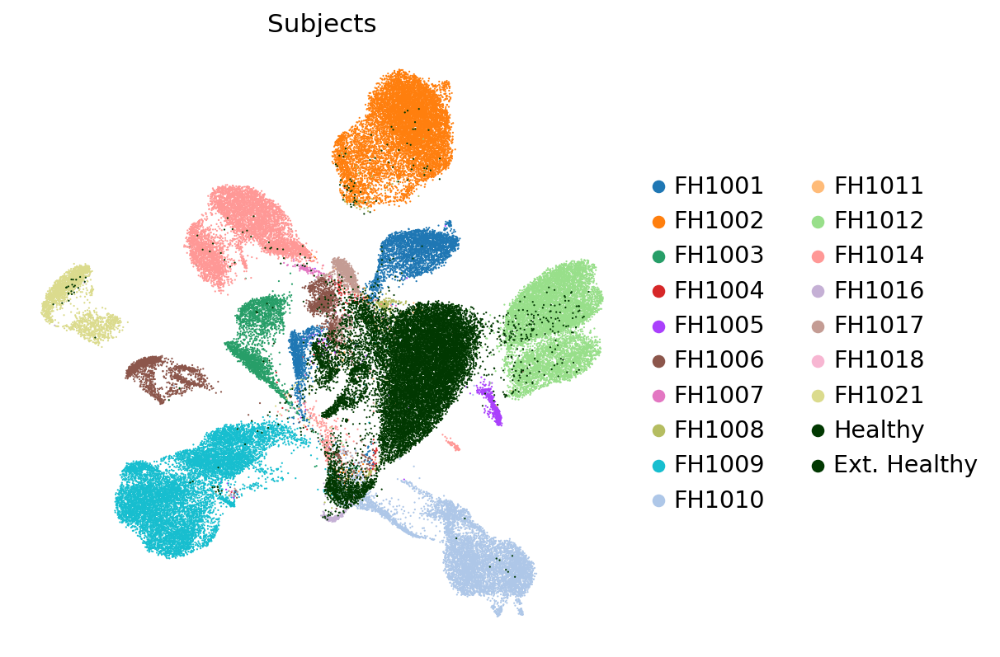

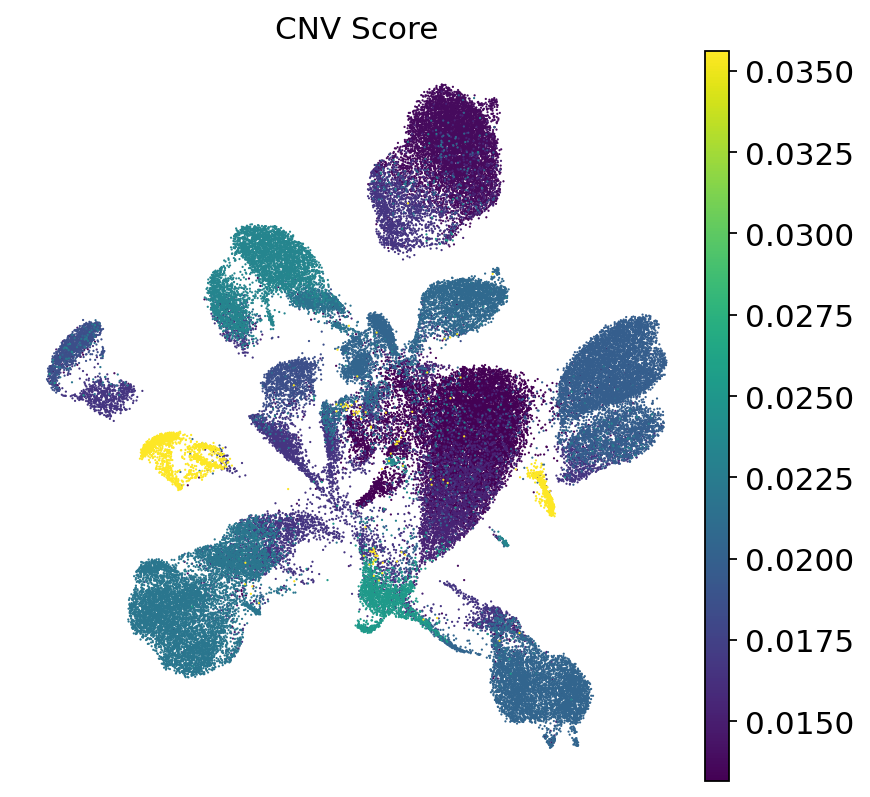

In [83]:
# figure parameters
sc.settings.set_figure_params(
    dpi=80,
    facecolor='white',
    frameon=False,
    fontsize=14,
    dpi_save=300,
    figsize=(6,6),
    format='png'
)

# plot and save umap with new subject labels
sc.pl.umap(
    adata,
    color='subject_labels',
    palette=list(subject_colors.values()),
    title='Subjects',
    size=4,
    save="_cnv_subjects_pretx_healthy_atlas_umap_20251021.png"
)

# plot and save umap showing CNV score
sc.pl.umap(
    adata,
    color='cnv_score',
    title='CNV Score',
    size=4,
    vmax='p99',
    vmin='p1',
    save='_cnv_score_umap_pretx_healthy_atlas_umap_20251021.png'
)

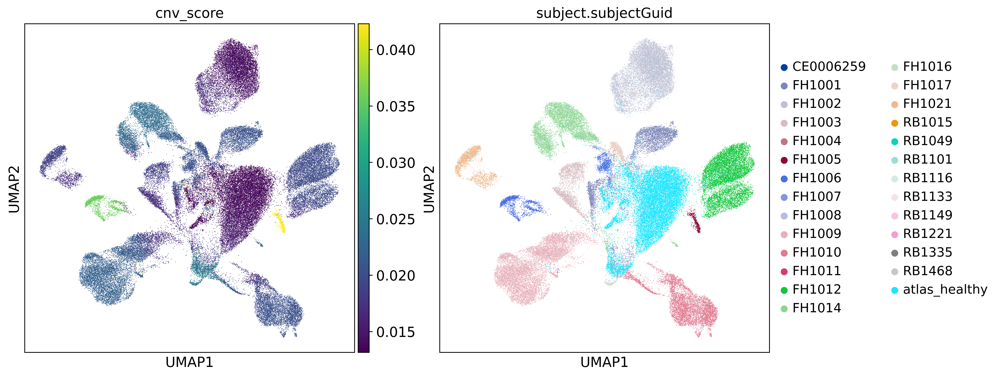

In [32]:
# visualization check
sc.settings.set_figure_params(dpi=300, figsize=(6,6))
                              
sc.pl.umap(adata, color = ['cnv_score', 'subject.subjectGuid'])

In [23]:
# write out cnv processed object with new healthy labels and subject colors
adata.write('../../../data/rna/infercnv/pretx_cnv_20251010.h5ad')

In [6]:
# read in cnv processed pretx object
adata = sc.read_h5ad('../../../data/rna/infercnv/pretx_cnv_20251010.h5ad')

In [3]:
# add new healthy catergory to subject column for plotting
adata.obs['subject.subjectGuid'] = adata.obs['subject.subjectGuid'].cat.add_categories('Healthy External Atlas')

# replace NaNs with Healty
adata.obs['subject.subjectGuid'] = adata.obs['subject.subjectGuid'].fillna('Healthy External Atlas')

# sanity check
adata.obs['subject.subjectGuid'].head()

1d4b50cae88711eca2fc4e28d07d5108    FH1011
1d562388e88711eca2fc4e28d07d5108    FH1011
1d5c134ce88711eca2fc4e28d07d5108    FH1011
1d5d79e4e88711eca2fc4e28d07d5108    FH1011
1d63d1fee88711eca2fc4e28d07d5108    FH1011
Name: subject.subjectGuid, dtype: category
Categories (27, object): ['CE0006259', 'FH1001', 'FH1002', 'FH1003', ..., 'RB1221', 'RB1335', 'RB1468', 'Healthy External Atlas']

In [5]:
# apply filtering to just see just MM Pre-Treatment and healthy reference
mask = adata.obs['subject.subjectGuid'].str.startswith('FH') | adata.obs['subject.subjectGuid'].str.startswith('Healthy External Atlas')
adata_filtered = adata[mask].copy()

/home/workspace/environment/minimal/lib/python3.11/site-packages/anndata/_core/storage.py:39: ImplicitModificationWarning: X should not be a np.matrix, use np.ndarray instead.
  warnings.warn(msg, ImplicitModificationWarning)


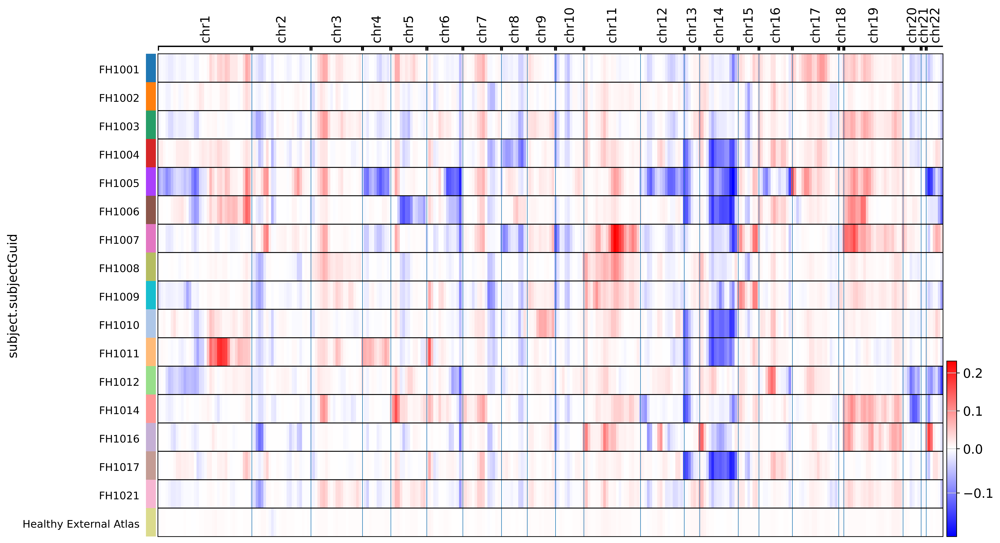

In [7]:
# set high-resolution plotting parameters globally
sc.settings.set_figure_params(dpi=300, figsize=(12, 18))

cnv.pl.chromosome_heatmap_summary(adata_filtered, 
                           groupby="subject.subjectGuid", 
                           # figsize=(12, 16),  # Adjust figure size
                           dendrogram=False,
                           save="cnv_heatmap_summary_by_subject_healthy_renamed_20251021.pdf")

In [47]:
# extract the CNV matrix from infercnvpy
# usually stored in layers['X_cnv'] after infercnvpy
cnv_matrix = adata_filtered.obsm['X_cnv']
cnv_matrix = cnv_matrix.toarray() if hasattr(cnv_matrix, "toarray") else cnv_matrix

# use CNV bin names from var
if 'bin' in adata_filtered.var.columns:
    bin_names = adata_filtered.var['bin'].astype(str)
else:
    # just in case generic names like bin_1, bin_2, ...
    bin_names = [f'bin_{i+1}' for i in range(cnv_matrix.shape[1])]

# create df rows = cells, columns = CNV bins
cnv_df = pd.DataFrame(cnv_matrix, index=adata_filtered.obs_names, columns=bin_names)

# add subject
cnv_df['subject'] = adata_filtered.obs['subject.subjectGuid'].values

# aggregate by subject (mean CNV per bin)
cnv_summary = cnv_df.groupby('subject').mean()

# save to CSV
cnv_summary.to_csv("cnv_summary_by_subject_corrected.csv")

/tmp/ipykernel_5447/3379476238.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cnv_summary = cnv_df.groupby('subject').mean()
